In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

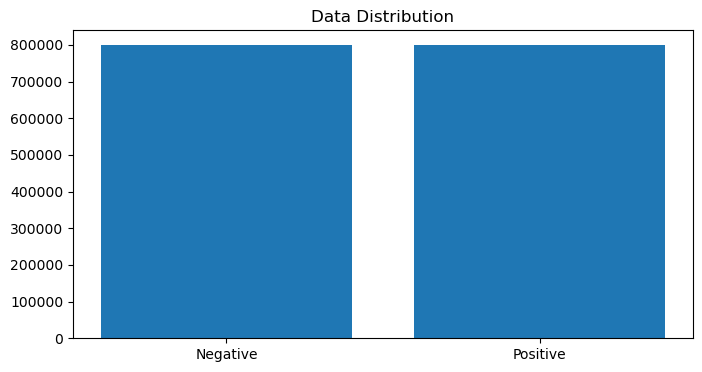

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

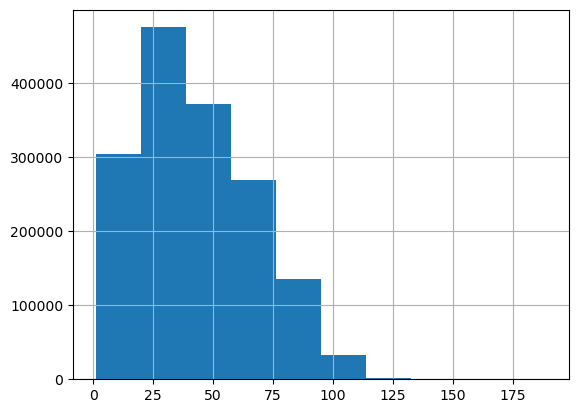

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('data/letter-frequencies.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081622,4709505.0
1,b,975326,0.016904,0.014911,860363.0
2,c,1705409,0.029557,0.027804,1604242.0
3,d,2289515,0.039680,0.042505,2452495.0
4,e,6471295,0.112156,0.126945,7324615.0
5,f,878849,0.015232,0.022867,1319376.0
6,g,2231747,0.038679,0.020138,1161951.0
7,h,2234047,0.038719,0.060904,3514108.0
8,i,3779579,0.065505,0.069619,4016947.0
9,j,143817,0.002493,0.001529,88228.0


<Axes: ylabel='letter'>

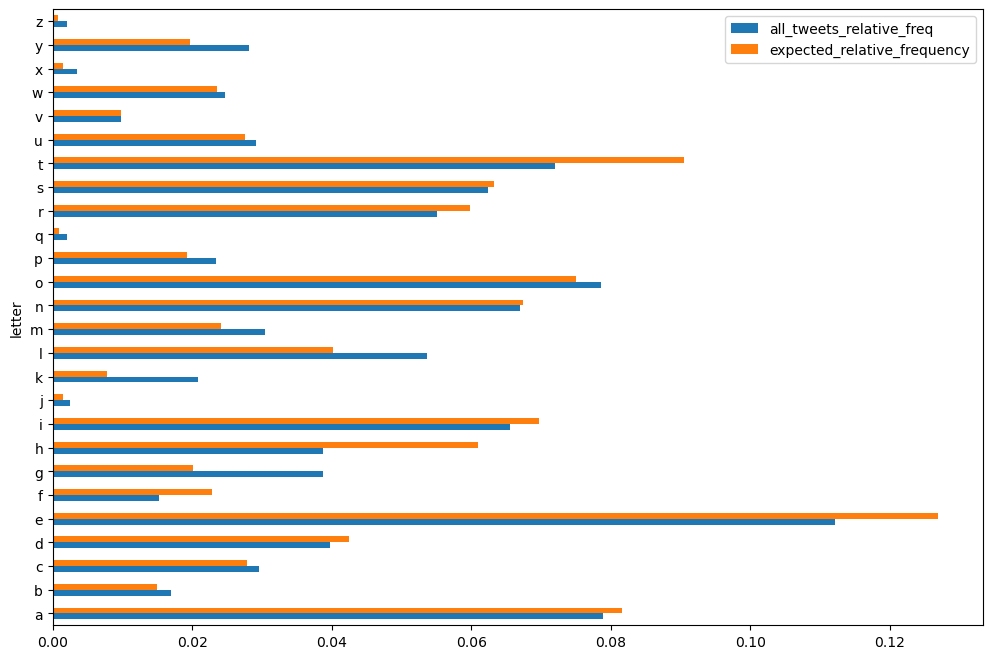

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.65%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.966544
expected,0.966544,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.15896165070398

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805717334

### Positives + Negatives

<BarContainer object of 20 artists>

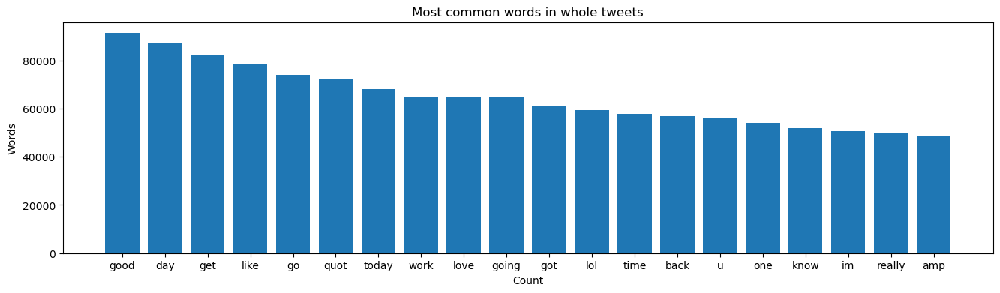

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

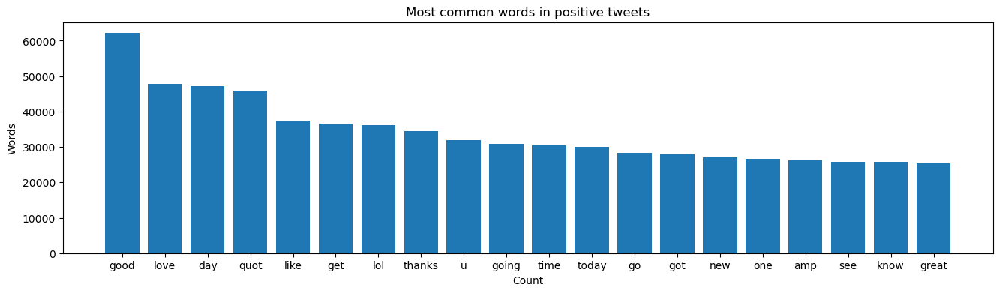

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

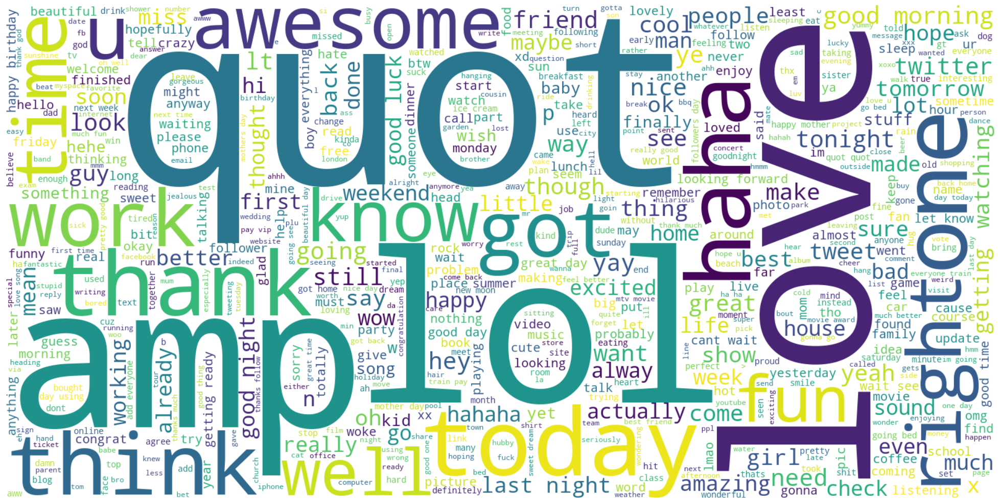

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

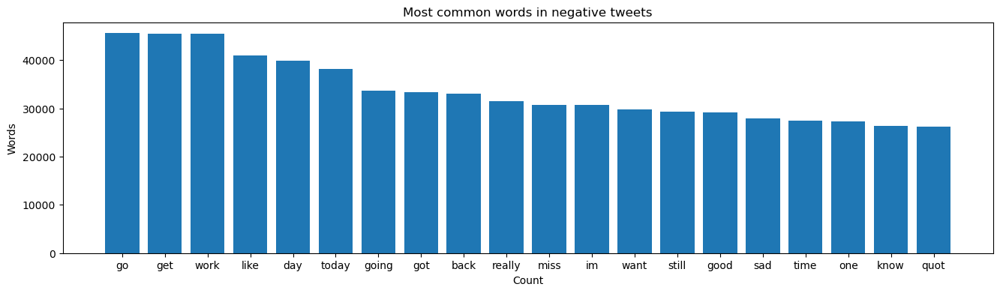

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

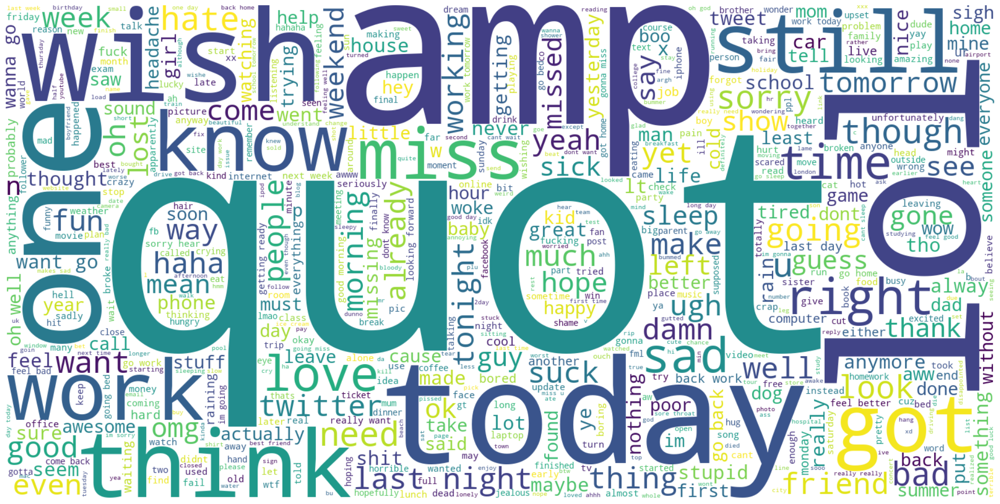

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 290458


In [31]:
from keras.utils import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [32]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [33]:
MODELS_PATH = 'models'
EMBEDDING_DIMENSION = 300

In [34]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400001 word vectors.


## Feature Extraction

### Bag of Words

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit_transform(first_K_tweets)

# Dictionary
# Assuming you've already created and fitted your CountVectorizer object named 'vectorizer'
vectorizer.get_feature_names_out()


array(['00', '000', '000th', ..., 'zzzzz', 'zzzzzz', 'zzzzzzzz'],
      dtype=object)

In [36]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [37]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

si quiero irrrrrr pero tengo que trabajar las seis de la manana sure spelled right lol fun
[0 0 0 ... 0 0 0]
ha expect politeness airport plane gonna happen unless super frequent flyer
[0 0 0 ... 0 0 0]
oh french tourney
[0 0 0 ... 0 0 0]
happens daily basis one day know though
[0 0 0 ... 0 0 0]
sucker celebrity amp live chats sad lol
[0 0 0 ... 0 0 0]
end ghostbusters think cemetary controller died gamertag radio live gt
[0 0 0 ... 0 0 0]
sitting trying figure left right life
[0 0 0 ... 0 0 0]
excited go adventures john tomorrow time sweet dreams
[0 0 0 ... 0 0 0]
wish southern boy
[0 0 0 ... 0 0 0]
yeah amp kick dead buy new charger grrr
[0 0 0 ... 0 0 0]
glad twitter tech people fix account
[0 0 0 ... 0 0 0]
hi lele hahahahaha feels weird call lele di ako sanay alwats leanne
[0 0 0 ... 0 0 0]
woke early today say sleep raining place bother tomorrow monday
[0 0 0 ... 0 0 0]
things getting difficult anymore
[0 0 0 ... 0 0 0]
imageless well
[0 0 0 ... 0 0 0]
jessaanderson real garage s

### tf-idf

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'si': 16694,
 'quiero': 14900,
 'irrrrrr': 9594,
 'pero': 13899,
 'tengo': 18438,
 'que': 14876,
 'trabajar': 19047,
 'las': 10588,
 'seis': 16300,
 'la': 10491,
 'manana': 11431,
 'sure': 18022,
 'spelled': 17362,
 'right': 15591,
 'lol': 11047,
 'fun': 7399,
 'ha': 8199,
 'expect': 6500,
 'politeness': 14285,
 'airport': 917,
 'plane': 14139,
 'gonna': 7827,
 'happen': 8332,
 'unless': 19645,
 'super': 17979,
 'frequent': 7280,
 'flyer': 7064,
 'oh': 13185,
 'french': 7275,
 'tourney': 19026,
 'happens': 8338,
 'daily': 4883,
 'basis': 1960,
 'day': 5015,
 'know': 10382,
 'sucker': 17873,
 'celebrity': 3498,
 'amp': 1104,
 'live': 10961,
 'chats': 3629,
 'sad': 15920,
 'end': 6207,
 'ghostbusters': 7671,
 'think': 18615,
 'cemetary': 3509,
 'controller': 4398,
 'died': 5368,
 'gamertag': 7507,
 'radio': 14951,
 'gt': 8103,
 'sitting': 16835,
 'trying': 19222,
 'figure': 6861,
 'left': 10725,
 'life': 10835,
 'excited': 6461,
 'adventures': 764,
 'john': 9905,
 'tomorrow': 18922,
 't

In [39]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

si quiero irrrrrr pero tengo que trabajar las seis de la manana sure spelled right lol fun
  (0, 19047)	0.29892037753744244
  (0, 18438)	0.29892037753744244
  (0, 18022)	0.16424571674603392
  (0, 17362)	0.2786277335366768
  (0, 16694)	0.25180231731251723
  (0, 16300)	0.29892037753744244
  (0, 15591)	0.14943822324882053
  (0, 14900)	0.2870499417565104
  (0, 14876)	0.2622443675210959
  (0, 13899)	0.27209496131328287
  (0, 11431)	0.2786277335366768
  (0, 11047)	0.12742295906971435
  (0, 10588)	0.26675729775574475
  (0, 10491)	0.2003390986408335
  (0, 9594)	0.29892037753744244
  (0, 7399)	0.1478833748583702
ha expect politeness airport plane gonna happen unless super frequent flyer
  (0, 19645)	0.29532319045932276
  (0, 17979)	0.24850382624563258
  (0, 14285)	0.3836823083485652
  (0, 14139)	0.2831941301863632
  (0, 8332)	0.2666837708253161
  (0, 8199)	0.2558733593110551
  (0, 7827)	0.20091669020955044
  (0, 7280)	0.3576354775608777
  (0, 7064)	0.3836823083485652
  (0, 6500)	0.3105596097327

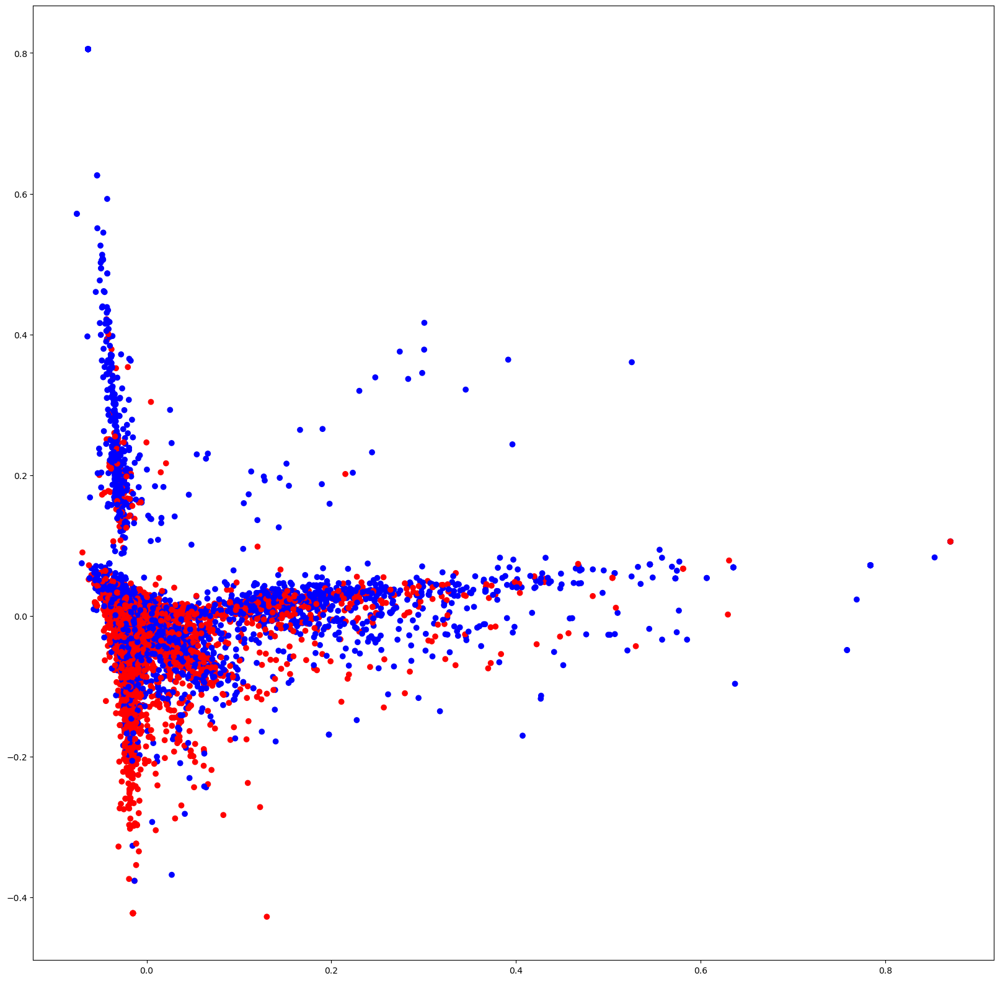

In [41]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import HashingVectorizer

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).toarray()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### CNN Model #1


In [42]:
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, SpatialDropout1D, Dense, Input, Dropout, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [43]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)
model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(factor=0.1, min_lr=0.01, monitor='val_loss', verbose=1)

history = model.fit(X_train, y_train, batch_size=1024, epochs=10, validation_data=(X_test, y_test), callbacks=[reduce_lr])


Epoch 1/10
1245/1245 [==============================] - 54s 37ms/step - loss: 0.5189 - accuracy: 0.7409 - val_loss: 0.5062 - val_accuracy: 0.7544 - lr: 0.0010
Epoch 2/10
1245/1245 [==============================] - 49s 40ms/step - loss: 0.4886 - accuracy: 0.7631 - val_loss: 0.4755 - val_accuracy: 0.7724 - lr: 0.0010
Epoch 3/10
1245/1245 [==============================] - 54s 43ms/step - loss: 0.4792 - accuracy: 0.7696 - val_loss: 0.4746 - val_accuracy: 0.7729 - lr: 0.0010
Epoch 4/10
1245/1245 [==============================] - 57s 46ms/step - loss: 0.4737 - accuracy: 0.7732 - val_loss: 0.4697 - val_accuracy: 0.7761 - lr: 0.0010
Epoch 5/10
1245/1245 [==============================] - 60s 48ms/step - loss: 0.4690 - accuracy: 0.7761 - val_loss: 0.4689 - val_accuracy: 0.7773 - lr: 0.0010
Epoch 6/10
1245/1245 [==============================] - 59s 48ms/step - loss: 0.4661 - accuracy: 0.7780 - val_loss: 0.4705 - val_accuracy: 0.7735 - lr: 0.0010
Epoch 7/10
1245/1245 [========================

In [44]:
model.save('models/cnn_model.h5')

In [45]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

In [46]:
load_model = tf.keras.models.load_model('models/cnn_model.h5')

# Check its architecture
load_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 30)]              0         
                                                                 
 embedding (Embedding)       (None, 30, 300)           87137400  
                                                                 
 spatial_dropout1d (SpatialD  (None, 30, 300)          0         
 ropout1D)                                                       
                                                                 
 conv1d (Conv1D)             (None, 26, 64)            96064     
                                                                 
 dense (Dense)               (None, 26, 512)           33280     
                                                                 
 dropout (Dropout)           (None, 26, 512)           0         
                                                             

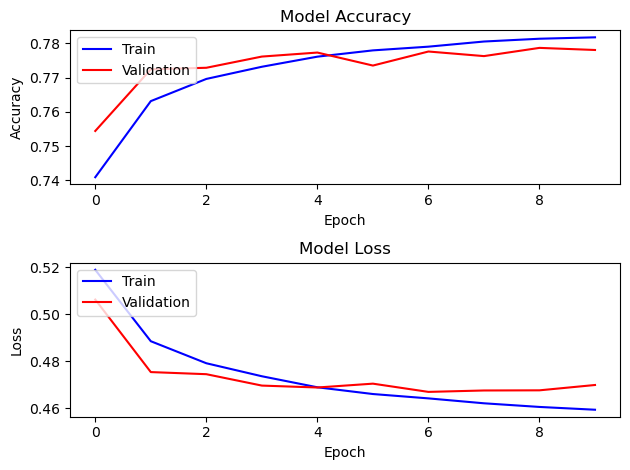

In [47]:
plt1, (plt2, plt3) = plt.subplots(2, 1)
plt2.plot(history.history['accuracy'], c='blue')  # Use 'history' variable here
plt2.plot(history.history['val_accuracy'], c='red')  # Use 'history' variable here
plt2.set_title('Model Accuracy')
plt2.set_ylabel('Accuracy')
plt2.set_xlabel('Epoch')
plt2.legend(['Train', 'Validation'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')  # Use 'history' variable here
plt3.plot(history.history['val_loss'], c='red')  # Use 'history' variable here
plt3.set_title('Model Loss')
plt3.set_ylabel('Loss')
plt3.set_xlabel('Epoch')
plt3.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [48]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 4s 109ms/step


#### Confusion Matrix

[[128899  30594]
 [ 40084 118889]]
[[80.81796693 19.18203307]
 [25.21434457 74.78565543]]


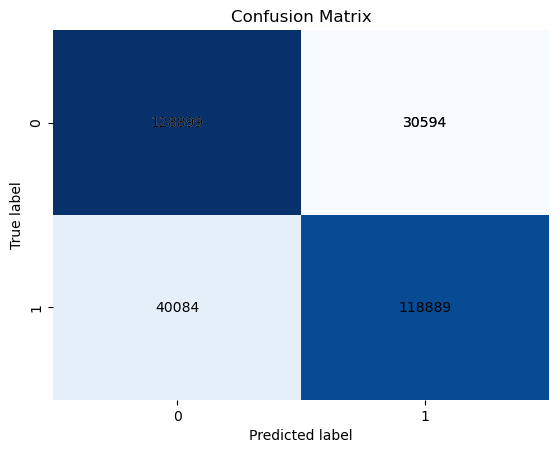

In [49]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
# Calculate percentages
cf_matrix_percent = cf_matrix.astype('int') / cf_matrix.sum(axis=1)[:, np.newaxis] * 100

print(cf_matrix)
print(cf_matrix_percent)

# Calculate confusion matrix

# Create seaborn heatmap with annotated cells
sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Add labels to each cell
for i in range(len(cf_matrix)):
    for j in range(len(cf_matrix)):
        plt.text(j + 0.5, i + 0.5, cf_matrix[i, j], ha='center', va='center', color='black')

# Set labels for axes
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Show plot
plt.show()


In [50]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.76      0.81      0.78    159493
    Positive       0.80      0.75      0.77    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466



### CNN Model #2


In [51]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(32, 5, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model2 = tf.keras.Model(sequence_input, outputs)


model2.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [52]:
history2 = model2.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 34s 13ms/step - loss: 0.5218 - accuracy: 0.7387 - val_loss: 0.4912 - val_accuracy: 0.7646 - lr: 0.0010
Epoch 2/10
2489/2489 [==============================] - 34s 14ms/step - loss: 0.4954 - accuracy: 0.7585 - val_loss: 0.4897 - val_accuracy: 0.7679 - lr: 0.0010
Epoch 3/10
2489/2489 [==============================] - 33s 13ms/step - loss: 0.4886 - accuracy: 0.7635 - val_loss: 0.4851 - val_accuracy: 0.7685 - lr: 0.0010
Epoch 4/10
2489/2489 [==============================] - 33s 13ms/step - loss: 0.4842 - accuracy: 0.7665 - val_loss: 0.4821 - val_accuracy: 0.7733 - lr: 0.0010
Epoch 5/10
2489/2489 [==============================] - 34s 13ms/step - loss: 0.4814 - accuracy: 0.7684 - val_loss: 0.4776 - val_accuracy: 0.7735 - lr: 0.0010
Epoch 6/10
2489/2489 [==============================] - 35s 14ms/step - loss: 0.4798 - accuracy: 0.7692 - val_loss: 0.4777 - val_accuracy: 0.7729 - lr: 0.0010
Epoch 7/10
2489/2489 [========================

In [53]:
model2.save('models/cnn_model2.h5')

In [54]:
load_model2 = tf.keras.models.load_model('models/cnn_model2.h5')

# Check its architecture
load_model2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 30)]              0         
                                                                 
 embedding (Embedding)       (None, 30, 300)           87137400  
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 30, 300)          0         
 lDropout1D)                                                     
                                                                 
 conv1d_1 (Conv1D)           (None, 26, 32)            48032     
                                                                 
 dense_3 (Dense)             (None, 26, 256)           8448      
                                                                 
 dropout_1 (Dropout)         (None, 26, 256)           0         
                                                           

Text(0.5, 0, 'epoch')

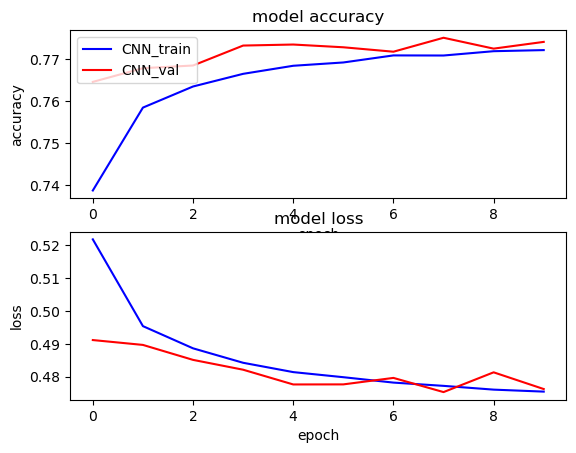

In [55]:
plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history2.history['accuracy'], c= 'blue')
plt2.plot(history2.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history2.history['loss'], c='blue')
plt3.plot(history2.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [56]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model2.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 2s 52ms/step


#### Confusion Matrix

[[116616  42877]
 [ 29051 129922]]
[[73.11668851 26.88331149]
 [18.27417234 81.72582766]]


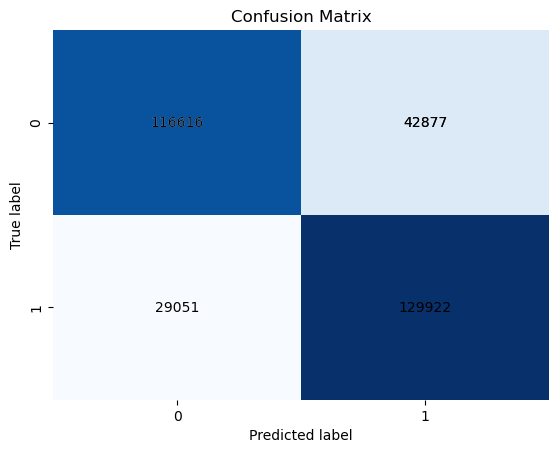

In [57]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
# Calculate percentages
cf_matrix_percent = cf_matrix.astype('int') / cf_matrix.sum(axis=1)[:, np.newaxis] * 100

print(cf_matrix)
print(cf_matrix_percent)

#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')


# Calculate confusion matrix

# Create seaborn heatmap with annotated cells
sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Add labels to each cell
for i in range(len(cf_matrix)):
    for j in range(len(cf_matrix)):
        plt.text(j + 0.5, i + 0.5, cf_matrix[i, j], ha='center', va='center', color='black')

# Set labels for axes
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Show plot
plt.show()


In [58]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.80      0.73      0.76    159493
    Positive       0.75      0.82      0.78    158973

    accuracy                           0.77    318466
   macro avg       0.78      0.77      0.77    318466
weighted avg       0.78      0.77      0.77    318466



In [59]:
from sklearn.metrics import roc_curve
y_pred_cnn1 = load_model.predict(X_test).ravel()
fpr_cnn1, tpr_cnn1, thresholds_cnn1 = roc_curve(y_test, y_pred_cnn1)
y_pred_cnn2 = load_model2.predict(X_test).ravel()
fpr_cnn2, tpr_cnn2, thresholds_cnn2 = roc_curve(y_test, y_pred_cnn2)

9953/9953 [==============================] - 27s 3ms/step


In [60]:
#AUC calculation
from sklearn.metrics import auc
auc_cnn1 = auc(fpr_cnn1, tpr_cnn1)
auc_cnn2 = auc(fpr_cnn2, tpr_cnn2)

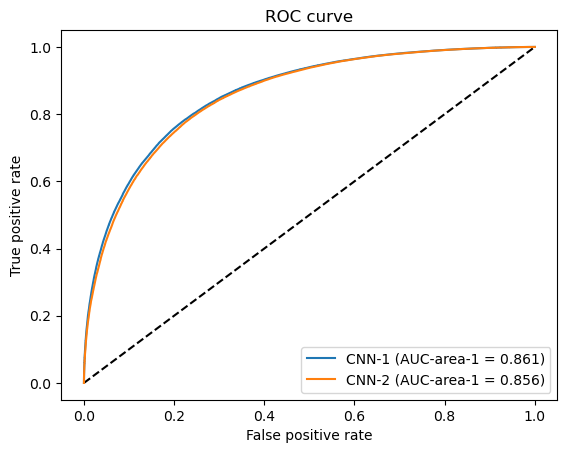

In [61]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_cnn1, tpr_cnn1, label='CNN-1 (AUC-area-1 = {:.3f})'.format(auc_cnn1))
plt.plot(fpr_cnn2, tpr_cnn2, label='CNN-2 (AUC-area-1 = {:.3f})'.format(auc_cnn2))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

### Entropy and Information Gain

In [62]:
from scipy.stats import entropy
from math import log, e
def entropy(labels, base=None):
    """ Computes entropy of label distribution. """

    n_labels = len(labels)

    if n_labels <= 1:
        return 0

    value,counts = np.unique(labels, return_counts=True)
    probs = counts / n_labels
    n_classes = np.count_nonzero(probs)

    if n_classes <= 1:
        return 0

    ent = 0.

    # Compute entropy
    base = e if base is None else base
    for i in probs:
        ent -= i * log(i, base)

    return ent

In [63]:
ent_df = entropy(df)

In [64]:
ent_df

14.73368002815221

In [65]:
df_f = pd.read_csv('data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df_f.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

In [66]:
# Data reduction
df_f =  df_f.drop(['id'], axis=1)

In [67]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df_f.label = df_f.label.apply(lambda x: convert_labels(x))

In [68]:
ent_df_first = entropy(df_f)
ent_df_first

41.08269441306875